In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import numpy as np
import numpy.random as random
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import bbknn

import os
import joblib

In [2]:
sc.settings.verbosity = 0            # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map = 'viridis', figsize = (5, 5))

scanpy==1.7.1 anndata==0.7.5 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


## Read in all data

In [3]:
adata = sc.read_h5ad('/nfs/team205/heart/anndata_objects/8regions/scVI/subsets/aCM_post-scVI.h5ad')
adata

AnnData object with n_obs × n_vars = 40543 × 28086
    obs: 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', '_scvi_batch', '_scvi_labels'
    var: 'gene_name_scRNA-0', 'gene_name_snRNA-1', 'gene_name_multiome-2', 'n_cells'
    uns: '_scvi', 'cell_or_nuclei_colors', 'cell_state_HCAv1_colors', 'cell_state_scNym_colors', 'cell_type_colors', 'donor_colors', 'kit_10x_colors', 'leiden_scVI_colors', 'region_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_continuous', 'latent_gene_encoding'
    layers: 'scvi_normalized'
    obsp: 'connectivities', 'distanc

In [4]:
genename_column='gene_name_multiome-2'

# replace the var_names with gene name, for both adata.var and adata.raw.var
adata.var['gene_id']=adata.var_names
adata.var.set_index(genename_column, inplace=True)

In [5]:
print(adata.shape)
adata = adata[adata.obs['region'].isin(['SAN'])]
#print(adata.shape)
#adata = adata[adata.obs['cell_type'].isin(['Atrial Cardiomyocyte'])]
#print(adata.shape)
#adata = adata[adata.obs['donor'].isin(['A61'])]
#print(adata.shape)

(40543, 28086)


In [6]:
adata.X.data[:10]

array([ 1.,  1.,  1.,  1.,  2., 11.,  1.,  4.,  1.,  1.], dtype=float32)

In [7]:
# normalise and logtransform
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

/opt/conda/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
/opt/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


# Clustering

## Deciding resolution

In [8]:
# Choose min_dist, spread, resolutions
min_dist = 0.2 # default = 0.5
spread = 1 #default = 1

In [9]:
# Since we are using the scVI latent space we do not need to recalculate HVGs etc.
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40, use_rep = 'X_scVI')
sc.tl.umap(adata, min_dist=min_dist, spread=spread, n_components=3)

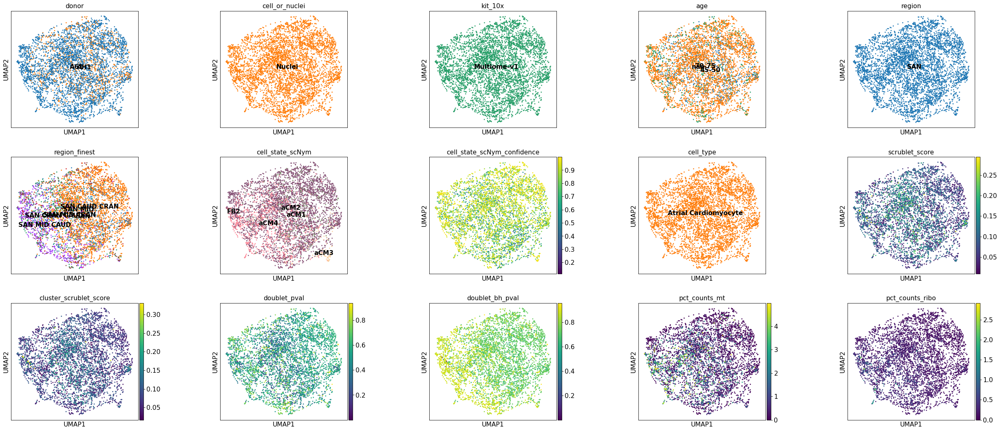

In [10]:
sc.pl.umap(adata, color=['donor','cell_or_nuclei','kit_10x','age','region','region_finest','cell_state_scNym','cell_state_scNym_confidence','cell_type','scrublet_score','cluster_scrublet_score','doublet_pval','doublet_bh_pval','pct_counts_mt','pct_counts_ribo'],wspace=0.5,ncols=5,legend_loc='on data')

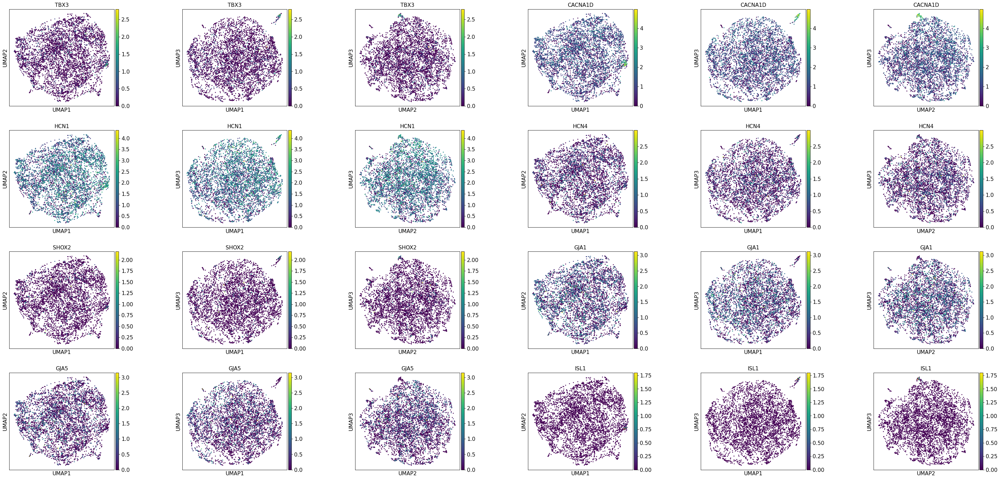

In [11]:
sc.pl.umap(adata, color=['TBX3','CACNA1D','HCN1','HCN4','SHOX2','GJA1','GJA5','ISL1'], components='all',wspace=0.5, ncols=6)

In [12]:
resolutions = [
    0.1,
    0.2,
    0.3,
    0.4,
    0.5,
    0.6,
    0.7,
    0.8,
    0.9,
    1.0,
#    1.2,
#    1.5,
#    2.0,
#    3.0,
#    4.0
]

leiden_0.1


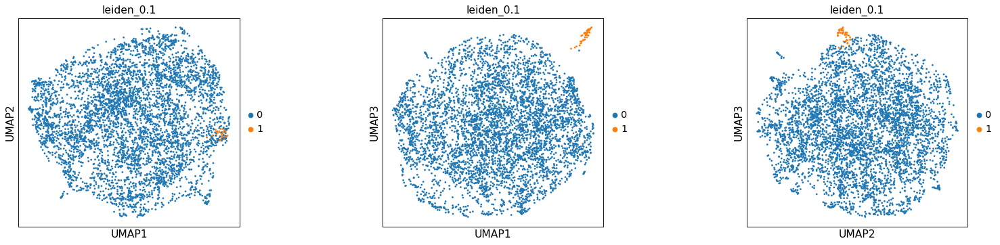

leiden_0.2


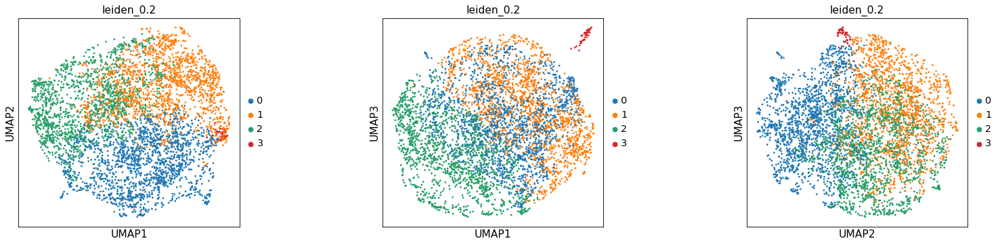

leiden_0.3


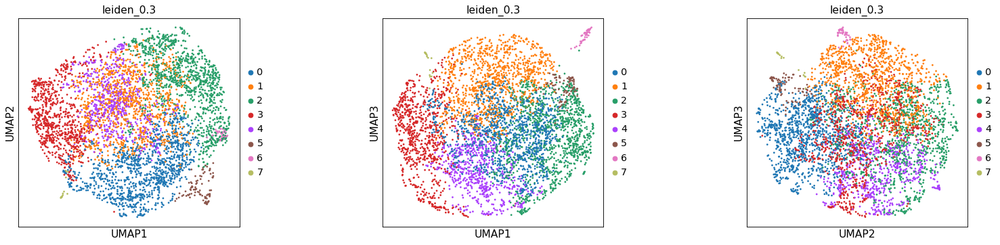

leiden_0.4


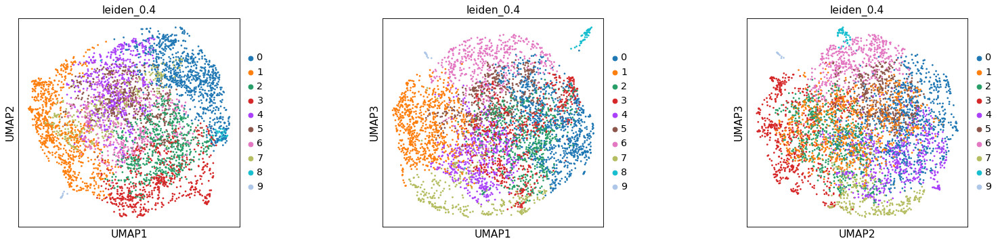

leiden_0.5


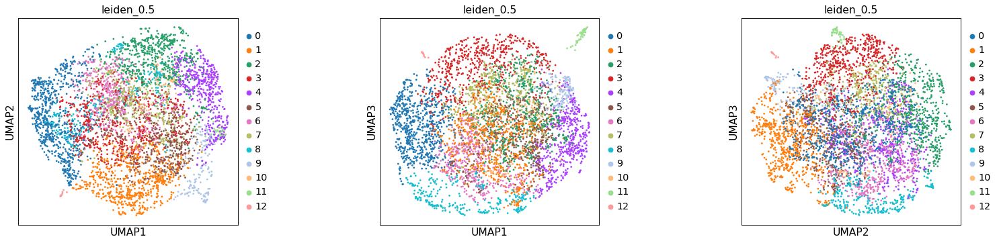

leiden_0.6


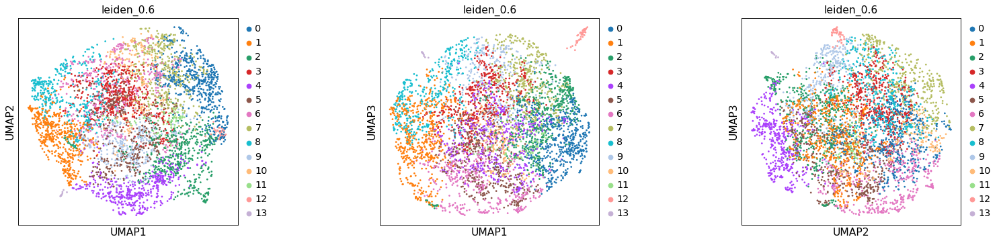

leiden_0.7


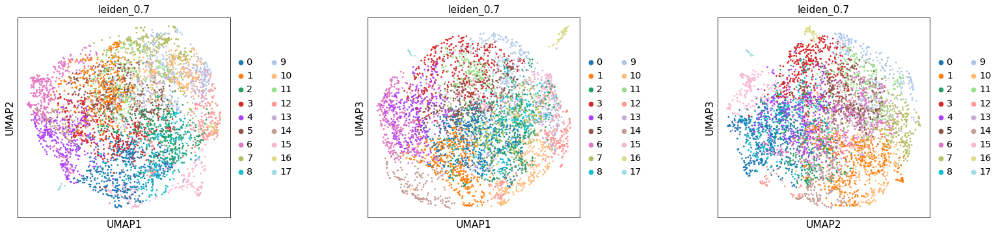

leiden_0.8


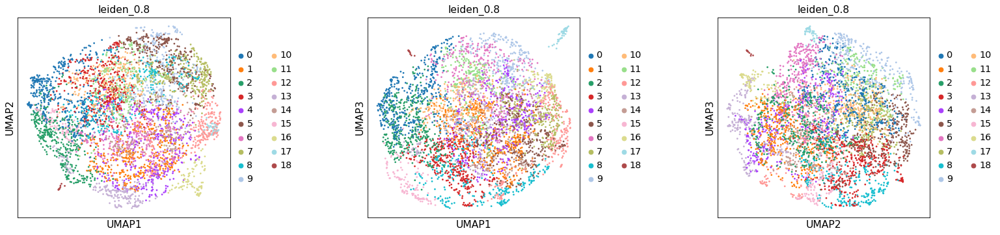

leiden_0.9


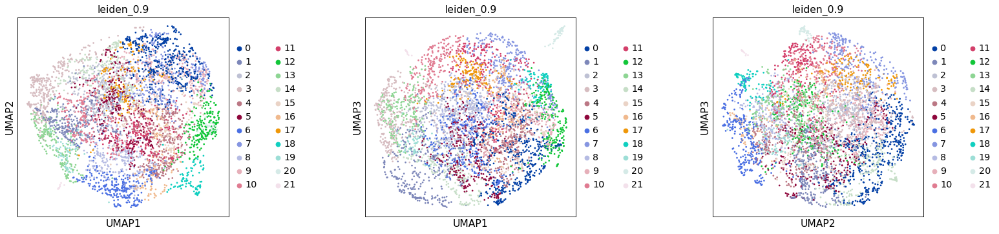

leiden_1.0


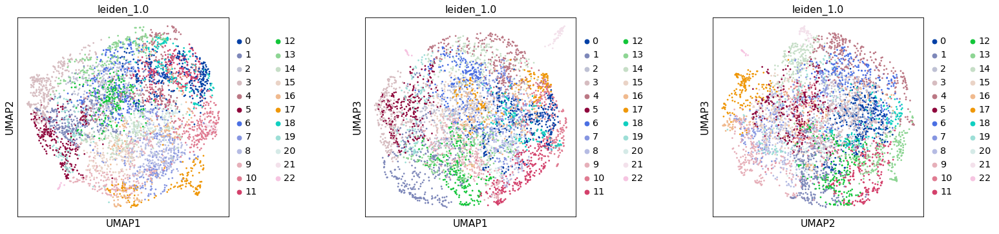

CPU times: user 13.6 s, sys: 312 ms, total: 13.9 s
Wall time: 13.9 s


In [13]:
%%time
#plot multiple resolutions
for res in resolutions:
    print(str(f'leiden_{res}'))
    sc.tl.leiden(adata, resolution=res, key_added=f'leiden_{res}')
    sc.pl.umap(adata, color=[f'leiden_{res}'], components='all', wspace=0.5)

# Choose a resolution

In [14]:
leiden_resolution = 0.2
chosen_res = f'leiden_{leiden_resolution}'

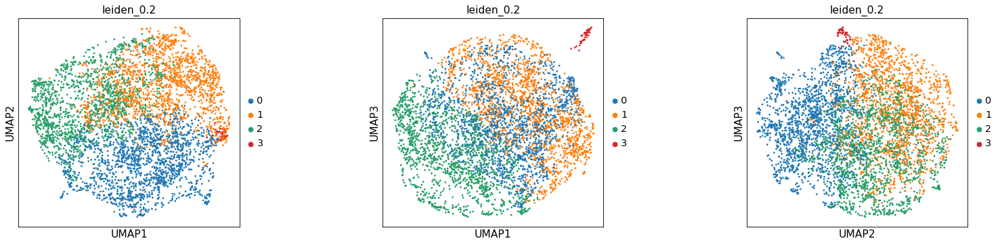

In [15]:
sc.pl.umap(adata, color=chosen_res,
           #groups='10',
           wspace=0.5, components ='all')

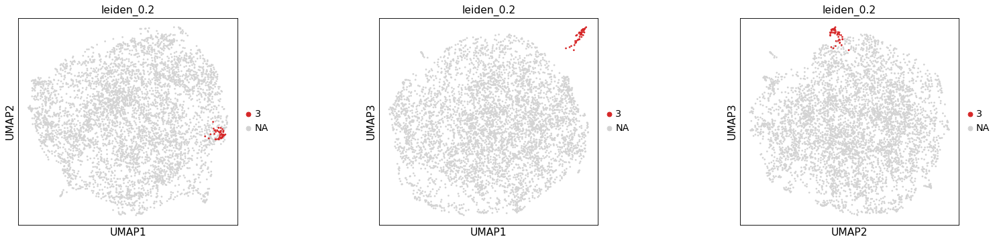

In [16]:
sc.pl.umap(adata, color=chosen_res,
           groups='3',
           wspace=0.5, components ='all')

# Look for doublets

In [17]:
# proportion of scrublet score > 0.2 per cluster
df=pd.crosstab(adata.obs['scrublet_score']>0.2,adata.obs[chosen_res]).T.copy()
df=df.apply(lambda x:x[True]/np.sum(x), axis=1)
df=df.sort_values(ascending=False)
df=pd.DataFrame(df).rename(columns={0:'prop of scrubscore>0.2'})
df

,prop of scrubscore>0.2
leiden_0.2,
3,0.127660
2,0.048652
0,0.047676
1,0.021991


In [18]:
adata.var_names_make_unique()

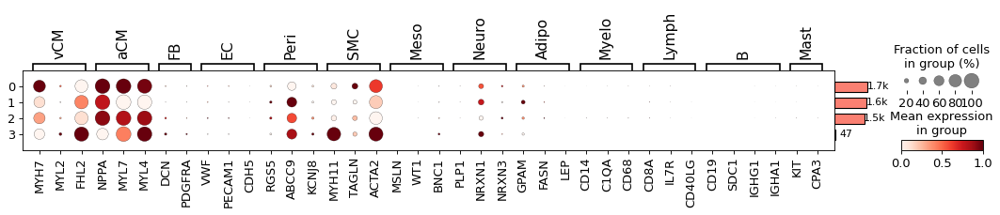

In [19]:
# Checking global markers
markers = {
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'FB': ['DCN', 'GCN', 'PDGFRA'],
    'EC': ['VWF', 'PECAM1', 'CDH5'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68'],
    'Lymph': ['CD8A', 'IL7R', 'CD40LG'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
}

for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata.var_names]

dp=sc.pl.dotplot(adata,
              markers, 
              groupby=chosen_res,
              dendrogram=False,
              standard_scale="var",
              color_map="Reds",
              return_fig=True
              # swap_axes=True,
             )
dp.add_totals().show()

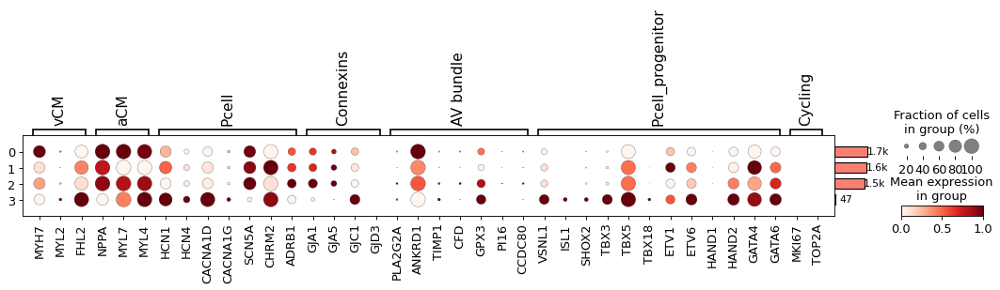

In [20]:
# Checking conduction system markers
markers={
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'Pcell': ['HCN1','HCN4','CACNA1D','CACNA1G','SCN5A','CHRM2','ADRB1'],
    'Connexins': ['GJA1','GJA5','GJC1','GJD3'],
    'AV bundle': ['PLA2G2A','ANKRD1','TIMP1','CFD','GPX3','PI16','CCDC80'],
    'Pcell_progenitor': ['VSNL1','ISL1','SHOX2','TBX3','TBX5','TBX18','ETV1','ETV6','HAND1','HAND2', 'GATA4', 'GATA6'],
    'Cycling':['MKI67','TOP2A']
}

for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata.var_names]

dp = sc.pl.dotplot(adata,
              markers, 
              groupby=chosen_res,
              dendrogram=False,
              standard_scale="var",
              color_map="Reds",
              return_fig = True
              # swap_axes=True,
             )
dp.add_totals().show()

# Find contributionsto each cluster

[]

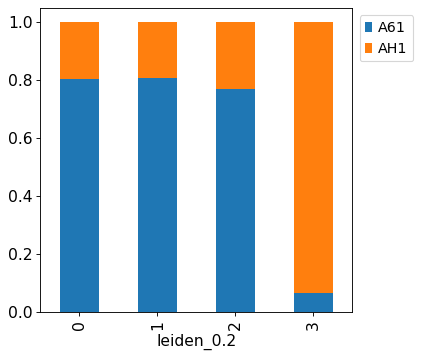

In [21]:
tmp = pd.crosstab(adata.obs[chosen_res],adata.obs['donor'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

[]

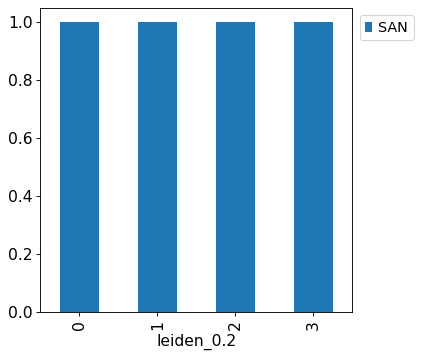

In [29]:
tmp = pd.crosstab(adata.obs[chosen_res],adata.obs['region'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

[]

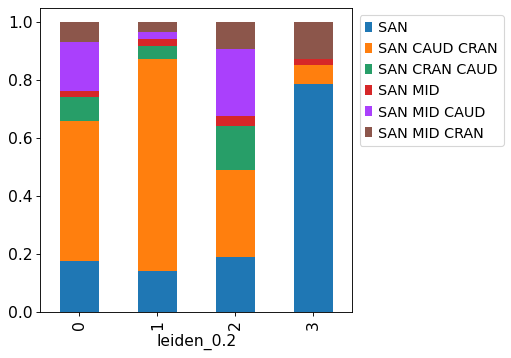

In [30]:
tmp = pd.crosstab(adata.obs[chosen_res],adata.obs['region_finest'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

[]

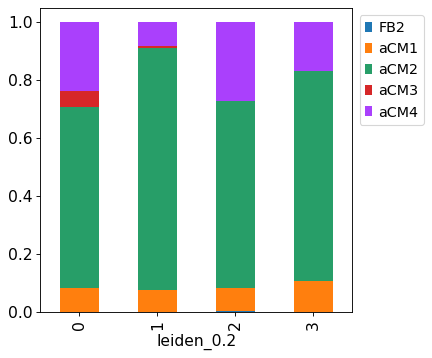

In [31]:
tmp = pd.crosstab(adata.obs[chosen_res],adata.obs['cell_state_scNym'], normalize='index')
# tmp.plot.bar().legend(loc=1)
ax = tmp.plot.bar(stacked=True)
ax.grid(False)
ax.legend(bbox_to_anchor=(1.0, 1.0))
ax.plot()

In [32]:
sc.tl.rank_genes_groups(adata,groupby=chosen_res,method='wilcoxon')

In [33]:
adata.var_names_make_unique()

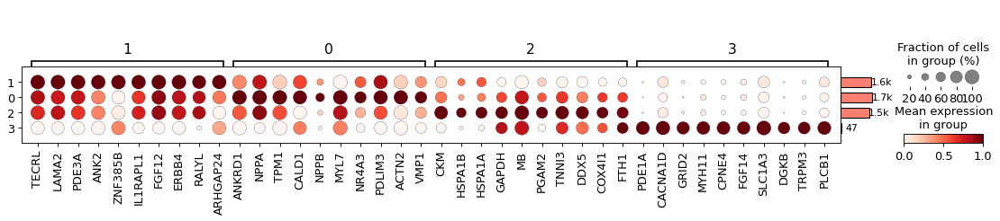

In [34]:
dp = sc.pl.rank_genes_groups_dotplot(adata,
                                groupby=chosen_res,
                                standard_scale='var',
                               return_fig=True)

dp.add_totals().show()

In [35]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
DEG_df = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals_adj', 'logfoldchanges']})

DEG_df.head(2)

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,3_p,3_l
0,ANKRD1,5.499542e-136,0.557194,TECRL,3.832166e-60,0.428172,CKM,4.617973e-63,0.879184,PDE1A,8.165554e-22,6.993303
1,NPPA,4.497981e-88,0.602966,LAMA2,1.633089e-53,0.405373,HSPA1B,3.306731e-60,1.281454,CACNA1D,1.829170e-19,3.701989


In [37]:
#select DEGs for your chosen cluster
clus = 3
DEG_df = DEG_df[[f'{clus}_n',f'{clus}_p',f'{clus}_l']]
DEG_df = DEG_df[DEG_df[f'{clus}_p'] < 0.01]
clus = DEG_df[f'{clus}_n'][DEG_df[f'{clus}_l'] > 0].tolist()
DEG_df.head(21)

,3_n,3_p,3_l
0,PDE1A,8.165554e-22,6.993303
1,CACNA1D,1.829170e-19,3.701989
2,GRID2,5.992580e-18,5.201088
3,MYH11,1.619355e-17,4.340594
4,CPNE4,1.690626e-17,3.993370
5,FGF14,3.308221e-17,4.656880
6,SLC1A3,1.062473e-16,2.145317
7,DGKB,3.309070e-16,6.371670
8,TRPM3,3.518276e-16,5.067783
9,PLCB1,1.057536e-13,2.462135


In [29]:
p183 = pd.read_csv('Pcell_183_index.csv')
p183 = p183['barcode'].tolist()

In [30]:
p183.remove('HCAHeartST11350192_HCAHeartST11445769_TAGCCTGAGCCAAATC-1')
p183.remove('HCAHeartST10773170_HCAHeartST10781447_CATTTGTTCGAGGAGT-1')
p183.remove('HCAHeartST11350198_HCAHeartST11445775_GTTCGCGCACAGGGAC-1')
p183.remove('HCAHeartST10773170_HCAHeartST10781447_TCTAGCCTCGGGATTT-1')
p183.remove('HCAHeartST10773170_HCAHeartST10781447_AGTAACCTCCTCACAC-1')

In [31]:
adata.obs['old_v_new'] = adata.obs[chosen_res].astype(str)
adata.obs.loc[p183, 'old_v_new'] = 'p183'

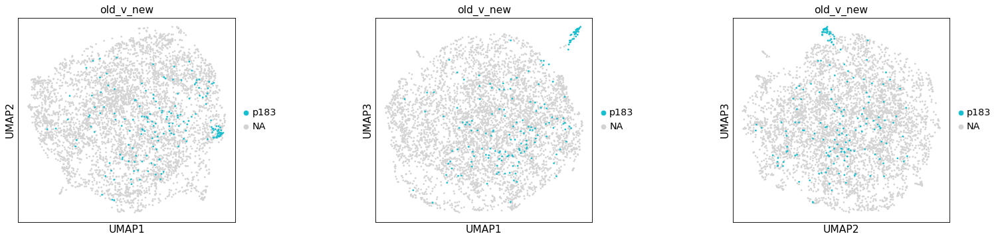

In [33]:
sc.pl.umap(adata, color='old_v_new',
           groups='p183',
           wspace=0.5, components ='all')

In [38]:
# Export newly defined SAN P cell barcodes
p47 = adata.obs.index[adata.obs[chosen_res] == '6']
p47 = p47.to_frame()
p47.to_csv('/home/jovyan/notebooks/suspension/scanpy_clustering/indexes/SANp47_index.csv', index = False, header=True)

In [39]:
# Have a closer look at the popualtion between a and vCM
# Annotate as 'intermediate_CM' then split by cell_type

adata.obs['cell_state'] = adata.obs[chosen_res].astype(str)
adata.obs['cell_state'][adata.obs['cell_state'] == '3'] = 'SAN_P_cell'
#adata.obs['cell_state'][adata.obs['cell_state'] == '6'] = 'AVN_vCM_?doublet'
#adata.obs['all_CM_annotation'][adata.obs['all_CM_annotation'] == '0'] = 'vCM'
#adata.obs['all_CM_annotation'][adata.obs['all_CM_annotation'] == '1'] = 'vCM'
#adata.obs['all_CM_annotation'][adata.obs['all_CM_annotation'] == '2'] = 'vCM'
#adata.obs['all_CM_annotation'][adata.obs['all_CM_annotation'] == '3'] = 'vCM'
#adata.obs['all_CM_annotation'][adata.obs['all_CM_annotation'] == '4'] = 'vCM'
#adata.obs['all_CM_annotation'][adata.obs['all_CM_annotation'] == '5'] = 'vCM'
#adata.obs['all_CM_annotation'][adata.obs['all_CM_annotation'] == '7'] = 'vCM'
#adata.obs['cell_state'][adata.obs['cell_state'] == '8'] = 'vCM_AVN_?doublet'
#adata.obs['all_CM_annotation'][adata.obs['all_CM_annotation'] == '9'] = 'vCM'
#adata.obs['all_CM_annotation'][adata.obs['all_CM_annotation'] == '11'] = 'vCM'

<ipython-input-39-e321ce3e3267>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['cell_state'][adata.obs['cell_state'] == '3'] = 'SAN_P_cell'


... storing 'cell_state' as categorical


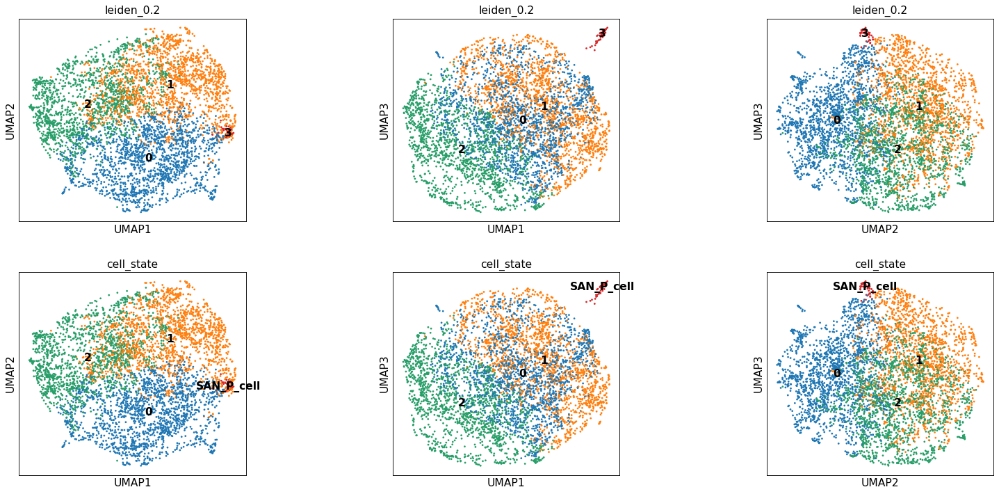

In [40]:
sc.pl.umap(adata, color=[chosen_res, 'cell_state'],
           #groups='10',
           wspace=0.5, ncols = 3, components ='all', legend_loc='on data')

In [41]:
#save the data
adata.write('/nfs/team205/heart/JC_annotated_adata/SAN.h5ad')